In [2]:
import thinkplot
import scipy.fftpack
import numpy as np

from thinkdsp import decorate, UncorrelatedGaussianNoise, read_wave, Spectrogram
from scipy.stats import linregress

PI2 = np.pi * 2

In [3]:
signal = UncorrelatedGaussianNoise()
noise = signal.make_wave(duration=1.0, framerate=16384)
noise.ys.shape

(16384,)

In [4]:
ns = 2 ** np.arange(5, 12)
ns

array([  32,   64,  128,  256,  512, 1024, 2048], dtype=int32)

In [5]:
def plot_bests(bests):    
    thinkplot.plot(ns, bests)
    thinkplot.config(xscale='log', yscale='log', legend=False)
    
    x = np.log(ns)
    y = np.log(bests)
    t = linregress(x,y)
    slope = t[0]

    return slope

In [6]:
def analyze1(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.linalg.solve(M, ys)
    return amps


54.6 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10000 loops each)
130 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10000 loops each)
411 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1000 loops each)
2.93 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
13.1 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
69.6 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
333 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


2.172947418143097

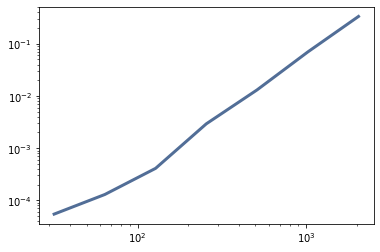

In [7]:
results = []
for N in ns:
    ts = (0.5 + np.arange(N)) / N
    freqs = (0.5 + np.arange(N)) / 2
    ys = noise.ys[:N]
    result = %timeit -r1 -o analyze1(ys, freqs, ts)
    results.append(result)
    
bests = [result.best for result in results]
plot_bests(bests)

In [8]:
def analyze2(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.dot(M, ys) / 2
    return amps

26.3 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10000 loops each)
71.4 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10000 loops each)
275 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1000 loops each)
939 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1000 loops each)
6.3 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
28.9 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
101 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)


2.055380926422722

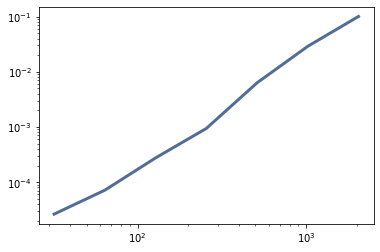

In [15]:
results = []
for N in ns:
    ts = (0.5 + np.arange(N)) / N
    freqs = (0.5 + np.arange(N)) / 2
    ys = noise.ys[:N]
    result = %timeit -r1 -o analyze2(ys, freqs, ts)
    results.append(result)
    
bests2 = [result.best for result in results]
plot_bests(bests2)

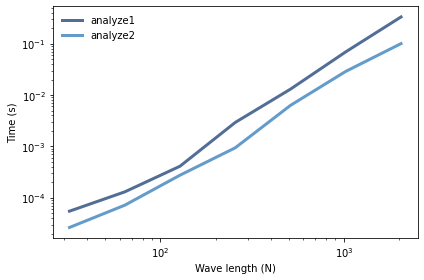

In [16]:
thinkplot.plot(ns, bests, label='analyze1')
thinkplot.plot(ns, bests2, label='analyze2')
decorate(xlabel='Wave length (N)', ylabel='Time (s)', **dict(xscale='log', yscale='log'))

In [17]:
wave = read_wave('6_2.wav')
wave.make_audio()

In [18]:
segment = wave.segment(start=10, duration=0.5)
segment.normalize()
segment.make_audio()

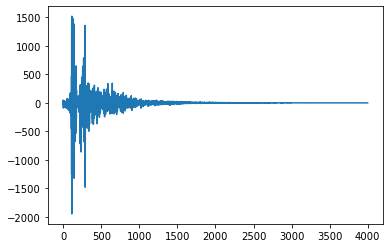

In [13]:
seg_dct = segment.make_dct()
seg_dct.plot(high=4000)

In [19]:
def compress(dct, thresh=1):
    count = 0
    for i, amp in enumerate(dct.amps):
        if np.abs(amp) < thresh:
            dct.hs[i] = 0
            count += 1
            
    n = len(dct.amps)
    print(count, n, 100 * count / n, sep='\t')

19744	22050	89.54195011337869


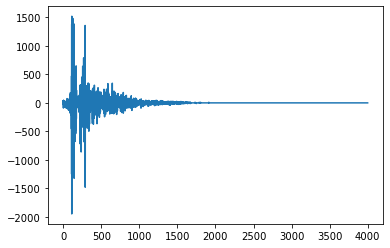

In [21]:
seg_dct = segment.make_dct()
compress(seg_dct, thresh=10)
seg_dct.plot(high=4000)

In [22]:
seg2 = seg_dct.make_wave()
seg2.make_audio()

In [23]:
def make_dct_spectrogram(wave, seg_length):
    window = np.hamming(seg_length)
    i, j = 0, seg_length
    step = seg_length // 2
    spec_map = {}

    while j < len(wave.ys):
        segment = wave.slice(i, j)
        segment.window(window)

        t = (segment.start + segment.end) / 2
        spec_map[t] = segment.make_dct()

        i += step
        j += step

    return Spectrogram(spec_map, seg_length)

In [24]:
spectro = make_dct_spectrogram(wave, seg_length=1024)
for t, dct in sorted(spectro.spec_map.items()):
    compress(dct, thresh=0.2)

1016	1024	99.21875
1010	1024	98.6328125
1007	1024	98.33984375
1002	1024	97.8515625
1001	1024	97.75390625
991	1024	96.77734375
983	1024	95.99609375
984	1024	96.09375
982	1024	95.8984375
988	1024	96.484375
970	1024	94.7265625
972	1024	94.921875
969	1024	94.62890625
968	1024	94.53125
971	1024	94.82421875
971	1024	94.82421875
968	1024	94.53125
963	1024	94.04296875
950	1024	92.7734375
958	1024	93.5546875
956	1024	93.359375
952	1024	92.96875
954	1024	93.1640625
942	1024	91.9921875
933	1024	91.11328125
937	1024	91.50390625
944	1024	92.1875
937	1024	91.50390625
931	1024	90.91796875
924	1024	90.234375
936	1024	91.40625
935	1024	91.30859375
931	1024	90.91796875
919	1024	89.74609375
927	1024	90.52734375
933	1024	91.11328125
931	1024	90.91796875
931	1024	90.91796875
930	1024	90.8203125
926	1024	90.4296875
928	1024	90.625
933	1024	91.11328125
915	1024	89.35546875
911	1024	88.96484375
921	1024	89.94140625
913	1024	89.16015625
919	1024	89.74609375
911	1024	88.96484375
928	1024	90.625
925	1024	90.3320

842	1024	82.2265625
848	1024	82.8125
847	1024	82.71484375
858	1024	83.7890625
857	1024	83.69140625
844	1024	82.421875
844	1024	82.421875
851	1024	83.10546875
847	1024	82.71484375
847	1024	82.71484375
847	1024	82.71484375
845	1024	82.51953125
852	1024	83.203125
838	1024	81.8359375
848	1024	82.8125
849	1024	82.91015625
843	1024	82.32421875
860	1024	83.984375
842	1024	82.2265625
856	1024	83.59375
852	1024	83.203125
848	1024	82.8125
846	1024	82.6171875
843	1024	82.32421875
853	1024	83.30078125
842	1024	82.2265625
849	1024	82.91015625
848	1024	82.8125
854	1024	83.3984375
839	1024	81.93359375
849	1024	82.91015625
854	1024	83.3984375
848	1024	82.8125
845	1024	82.51953125
840	1024	82.03125
827	1024	80.76171875
848	1024	82.8125
838	1024	81.8359375
841	1024	82.12890625
851	1024	83.10546875
847	1024	82.71484375
839	1024	81.93359375
852	1024	83.203125
842	1024	82.2265625
850	1024	83.0078125
844	1024	82.421875
846	1024	82.6171875
850	1024	83.0078125
854	1024	83.3984375
850	1024	83.0078125
844	1024	

862	1024	84.1796875
856	1024	83.59375
860	1024	83.984375
864	1024	84.375
866	1024	84.5703125
861	1024	84.08203125
856	1024	83.59375
847	1024	82.71484375
863	1024	84.27734375
851	1024	83.10546875
855	1024	83.49609375
866	1024	84.5703125
856	1024	83.59375
847	1024	82.71484375
857	1024	83.69140625
856	1024	83.59375
852	1024	83.203125
860	1024	83.984375
864	1024	84.375
854	1024	83.3984375
856	1024	83.59375
855	1024	83.49609375
855	1024	83.49609375
861	1024	84.08203125
855	1024	83.49609375
867	1024	84.66796875
858	1024	83.7890625
867	1024	84.66796875
857	1024	83.69140625
868	1024	84.765625
868	1024	84.765625
859	1024	83.88671875
865	1024	84.47265625
864	1024	84.375
865	1024	84.47265625
866	1024	84.5703125
863	1024	84.27734375
854	1024	83.3984375
861	1024	84.08203125
863	1024	84.27734375
856	1024	83.59375
859	1024	83.88671875
866	1024	84.5703125
854	1024	83.3984375
861	1024	84.08203125
859	1024	83.88671875
854	1024	83.3984375
869	1024	84.86328125
854	1024	83.3984375
866	1024	84.5703125
846	1

862	1024	84.1796875
857	1024	83.69140625
871	1024	85.05859375
857	1024	83.69140625
868	1024	84.765625
857	1024	83.69140625
863	1024	84.27734375
869	1024	84.86328125
864	1024	84.375
864	1024	84.375
860	1024	83.984375
873	1024	85.25390625
861	1024	84.08203125
849	1024	82.91015625
856	1024	83.59375
858	1024	83.7890625
860	1024	83.984375
850	1024	83.0078125
864	1024	84.375
849	1024	82.91015625
858	1024	83.7890625
855	1024	83.49609375
862	1024	84.1796875
855	1024	83.49609375
859	1024	83.88671875
861	1024	84.08203125
865	1024	84.47265625
862	1024	84.1796875
865	1024	84.47265625
858	1024	83.7890625
862	1024	84.1796875
858	1024	83.7890625
860	1024	83.984375
864	1024	84.375
862	1024	84.1796875
867	1024	84.66796875
860	1024	83.984375
861	1024	84.08203125
848	1024	82.8125
853	1024	83.30078125
848	1024	82.8125
856	1024	83.59375
859	1024	83.88671875
860	1024	83.984375
852	1024	83.203125
860	1024	83.984375
835	1024	81.54296875
863	1024	84.27734375
846	1024	82.6171875
857	1024	83.69140625
855	1024	83

839	1024	81.93359375
839	1024	81.93359375
845	1024	82.51953125
851	1024	83.10546875
848	1024	82.8125
841	1024	82.12890625
835	1024	81.54296875
830	1024	81.0546875
838	1024	81.8359375
839	1024	81.93359375
844	1024	82.421875
845	1024	82.51953125
839	1024	81.93359375
849	1024	82.91015625
837	1024	81.73828125
837	1024	81.73828125
836	1024	81.640625
844	1024	82.421875
841	1024	82.12890625
849	1024	82.91015625
837	1024	81.73828125
828	1024	80.859375
831	1024	81.15234375
845	1024	82.51953125
836	1024	81.640625
848	1024	82.8125
831	1024	81.15234375
847	1024	82.71484375
839	1024	81.93359375
835	1024	81.54296875
841	1024	82.12890625
839	1024	81.93359375
846	1024	82.6171875
840	1024	82.03125
844	1024	82.421875
840	1024	82.03125
849	1024	82.91015625
854	1024	83.3984375
849	1024	82.91015625
848	1024	82.8125
844	1024	82.421875
842	1024	82.2265625
841	1024	82.12890625
849	1024	82.91015625
844	1024	82.421875
835	1024	81.54296875
832	1024	81.25
826	1024	80.6640625
845	1024	82.51953125
834	1024	81.44531

896	1024	87.5
897	1024	87.59765625
897	1024	87.59765625
901	1024	87.98828125
900	1024	87.890625
896	1024	87.5
900	1024	87.890625
894	1024	87.3046875
896	1024	87.5
902	1024	88.0859375
898	1024	87.6953125
906	1024	88.4765625
905	1024	88.37890625
899	1024	87.79296875
892	1024	87.109375
899	1024	87.79296875
905	1024	88.37890625
896	1024	87.5
910	1024	88.8671875
902	1024	88.0859375
911	1024	88.96484375
914	1024	89.2578125
901	1024	87.98828125
911	1024	88.96484375
900	1024	87.890625
911	1024	88.96484375
913	1024	89.16015625
899	1024	87.79296875
909	1024	88.76953125
912	1024	89.0625
910	1024	88.8671875
898	1024	87.6953125
910	1024	88.8671875
919	1024	89.74609375
906	1024	88.4765625
908	1024	88.671875
906	1024	88.4765625
902	1024	88.0859375
911	1024	88.96484375
906	1024	88.4765625
902	1024	88.0859375
904	1024	88.28125
917	1024	89.55078125
915	1024	89.35546875
918	1024	89.6484375
920	1024	89.84375
917	1024	89.55078125
926	1024	90.4296875
908	1024	88.671875
921	1024	89.94140625
924	1024	90.23437

839	1024	81.93359375
831	1024	81.15234375
828	1024	80.859375
827	1024	80.76171875
837	1024	81.73828125
831	1024	81.15234375
833	1024	81.34765625
839	1024	81.93359375
837	1024	81.73828125
834	1024	81.4453125
836	1024	81.640625
842	1024	82.2265625
843	1024	82.32421875
829	1024	80.95703125
837	1024	81.73828125
841	1024	82.12890625
837	1024	81.73828125
843	1024	82.32421875
841	1024	82.12890625
823	1024	80.37109375
833	1024	81.34765625
835	1024	81.54296875
828	1024	80.859375
832	1024	81.25
831	1024	81.15234375
838	1024	81.8359375
838	1024	81.8359375
843	1024	82.32421875
847	1024	82.71484375
836	1024	81.640625
837	1024	81.73828125
834	1024	81.4453125
836	1024	81.640625
834	1024	81.4453125
832	1024	81.25
831	1024	81.15234375
831	1024	81.15234375
833	1024	81.34765625
825	1024	80.56640625
822	1024	80.2734375
819	1024	79.98046875
830	1024	81.0546875
838	1024	81.8359375
832	1024	81.25
831	1024	81.15234375
849	1024	82.91015625
835	1024	81.54296875
837	1024	81.73828125
840	1024	82.03125
828	1024	80

848	1024	82.8125
855	1024	83.49609375
853	1024	83.30078125
862	1024	84.1796875
843	1024	82.32421875
849	1024	82.91015625
850	1024	83.0078125
861	1024	84.08203125
852	1024	83.203125
852	1024	83.203125
851	1024	83.10546875
860	1024	83.984375
845	1024	82.51953125
866	1024	84.5703125
844	1024	82.421875
857	1024	83.69140625
858	1024	83.7890625
859	1024	83.88671875
852	1024	83.203125
841	1024	82.12890625
855	1024	83.49609375
852	1024	83.203125
851	1024	83.10546875
863	1024	84.27734375
860	1024	83.984375
846	1024	82.6171875
858	1024	83.7890625
848	1024	82.8125
859	1024	83.88671875
861	1024	84.08203125
858	1024	83.7890625
850	1024	83.0078125
866	1024	84.5703125
853	1024	83.30078125
863	1024	84.27734375
861	1024	84.08203125
860	1024	83.984375
868	1024	84.765625
862	1024	84.1796875
857	1024	83.69140625
868	1024	84.765625
868	1024	84.765625
859	1024	83.88671875
861	1024	84.08203125
860	1024	83.984375
860	1024	83.984375
858	1024	83.7890625
858	1024	83.7890625
871	1024	85.05859375
862	1024	84.17968

855	1024	83.49609375
861	1024	84.08203125
862	1024	84.1796875
864	1024	84.375
853	1024	83.30078125
850	1024	83.0078125
848	1024	82.8125
850	1024	83.0078125
855	1024	83.49609375
840	1024	82.03125
856	1024	83.59375
848	1024	82.8125
858	1024	83.7890625
857	1024	83.69140625
840	1024	82.03125
859	1024	83.88671875
851	1024	83.10546875
866	1024	84.5703125
853	1024	83.30078125
841	1024	82.12890625
848	1024	82.8125
858	1024	83.7890625
859	1024	83.88671875
869	1024	84.86328125
857	1024	83.69140625
860	1024	83.984375
853	1024	83.30078125
851	1024	83.10546875
856	1024	83.59375
865	1024	84.47265625
875	1024	85.44921875
858	1024	83.7890625
870	1024	84.9609375
853	1024	83.30078125
857	1024	83.69140625
860	1024	83.984375
855	1024	83.49609375
862	1024	84.1796875
854	1024	83.3984375
860	1024	83.984375
851	1024	83.10546875
859	1024	83.88671875
858	1024	83.7890625
858	1024	83.7890625
861	1024	84.08203125
851	1024	83.10546875
857	1024	83.69140625
853	1024	83.30078125
847	1024	82.71484375
860	1024	83.984375

832	1024	81.25
836	1024	81.640625
842	1024	82.2265625
829	1024	80.95703125
848	1024	82.8125
837	1024	81.73828125
832	1024	81.25
838	1024	81.8359375
831	1024	81.15234375
847	1024	82.71484375
842	1024	82.2265625
837	1024	81.73828125
849	1024	82.91015625
844	1024	82.421875
851	1024	83.10546875
846	1024	82.6171875
840	1024	82.03125
847	1024	82.71484375
844	1024	82.421875
842	1024	82.2265625
852	1024	83.203125
850	1024	83.0078125
847	1024	82.71484375
833	1024	81.34765625
843	1024	82.32421875
858	1024	83.7890625
846	1024	82.6171875
840	1024	82.03125
843	1024	82.32421875
853	1024	83.30078125
845	1024	82.51953125
845	1024	82.51953125
836	1024	81.640625
841	1024	82.12890625
848	1024	82.8125
848	1024	82.8125
847	1024	82.71484375
835	1024	81.54296875
831	1024	81.15234375
842	1024	82.2265625
845	1024	82.51953125
849	1024	82.91015625
844	1024	82.421875
838	1024	81.8359375
837	1024	81.73828125
835	1024	81.54296875
826	1024	80.6640625
839	1024	81.93359375
846	1024	82.6171875
840	1024	82.03125
853	102

892	1024	87.109375
889	1024	86.81640625
898	1024	87.6953125
890	1024	86.9140625
883	1024	86.23046875
889	1024	86.81640625
889	1024	86.81640625
898	1024	87.6953125
901	1024	87.98828125
891	1024	87.01171875
894	1024	87.3046875
905	1024	88.37890625
892	1024	87.109375
888	1024	86.71875
897	1024	87.59765625
891	1024	87.01171875
891	1024	87.01171875
902	1024	88.0859375
886	1024	86.5234375
891	1024	87.01171875
896	1024	87.5
892	1024	87.109375
898	1024	87.6953125
902	1024	88.0859375
900	1024	87.890625
896	1024	87.5
902	1024	88.0859375
898	1024	87.6953125
893	1024	87.20703125
902	1024	88.0859375
905	1024	88.37890625
893	1024	87.20703125
898	1024	87.6953125
890	1024	86.9140625
895	1024	87.40234375
900	1024	87.890625
903	1024	88.18359375
893	1024	87.20703125
904	1024	88.28125
892	1024	87.109375
884	1024	86.328125
892	1024	87.109375
906	1024	88.4765625
892	1024	87.109375
898	1024	87.6953125
906	1024	88.4765625
895	1024	87.40234375
893	1024	87.20703125
906	1024	88.4765625
898	1024	87.6953125
899	10

838	1024	81.8359375
842	1024	82.2265625
839	1024	81.93359375
846	1024	82.6171875
823	1024	80.37109375
841	1024	82.12890625
836	1024	81.640625
844	1024	82.421875
831	1024	81.15234375
826	1024	80.6640625
832	1024	81.25
828	1024	80.859375
839	1024	81.93359375
827	1024	80.76171875
828	1024	80.859375
823	1024	80.37109375
831	1024	81.15234375
823	1024	80.37109375
824	1024	80.46875
835	1024	81.54296875
825	1024	80.56640625
820	1024	80.078125
843	1024	82.32421875
834	1024	81.4453125
820	1024	80.078125
834	1024	81.4453125
838	1024	81.8359375
837	1024	81.73828125
837	1024	81.73828125
837	1024	81.73828125
834	1024	81.4453125
835	1024	81.54296875
844	1024	82.421875
830	1024	81.0546875
832	1024	81.25
831	1024	81.15234375
838	1024	81.8359375
832	1024	81.25
823	1024	80.37109375
837	1024	81.73828125
825	1024	80.56640625
843	1024	82.32421875
852	1024	83.203125
845	1024	82.51953125
829	1024	80.95703125
842	1024	82.2265625
842	1024	82.2265625
841	1024	82.12890625
831	1024	81.15234375
832	1024	81.25
837	1

839	1024	81.93359375
844	1024	82.421875
827	1024	80.76171875
842	1024	82.2265625
839	1024	81.93359375
848	1024	82.8125
830	1024	81.0546875
832	1024	81.25
837	1024	81.73828125
834	1024	81.4453125
836	1024	81.640625
839	1024	81.93359375
850	1024	83.0078125
834	1024	81.4453125
848	1024	82.8125
848	1024	82.8125
839	1024	81.93359375
842	1024	82.2265625
831	1024	81.15234375
843	1024	82.32421875
842	1024	82.2265625
847	1024	82.71484375
837	1024	81.73828125
835	1024	81.54296875
851	1024	83.10546875
842	1024	82.2265625
850	1024	83.0078125
845	1024	82.51953125
846	1024	82.6171875
844	1024	82.421875
846	1024	82.6171875
845	1024	82.51953125
843	1024	82.32421875
839	1024	81.93359375
851	1024	83.10546875
851	1024	83.10546875
850	1024	83.0078125
855	1024	83.49609375
855	1024	83.49609375
849	1024	82.91015625
848	1024	82.8125
850	1024	83.0078125
841	1024	82.12890625
843	1024	82.32421875
857	1024	83.69140625
852	1024	83.203125
860	1024	83.984375
844	1024	82.421875
859	1024	83.88671875
844	1024	82.421875

900	1024	87.890625
896	1024	87.5
895	1024	87.40234375
887	1024	86.62109375
890	1024	86.9140625
888	1024	86.71875
880	1024	85.9375
890	1024	86.9140625
886	1024	86.5234375
886	1024	86.5234375
892	1024	87.109375
901	1024	87.98828125
884	1024	86.328125
904	1024	88.28125
894	1024	87.3046875
897	1024	87.59765625
890	1024	86.9140625
895	1024	87.40234375
883	1024	86.23046875
874	1024	85.3515625
897	1024	87.59765625
883	1024	86.23046875
889	1024	86.81640625
887	1024	86.62109375
888	1024	86.71875
883	1024	86.23046875
890	1024	86.9140625
890	1024	86.9140625
870	1024	84.9609375
879	1024	85.83984375
884	1024	86.328125
876	1024	85.546875
880	1024	85.9375
879	1024	85.83984375
870	1024	84.9609375
891	1024	87.01171875
877	1024	85.64453125
876	1024	85.546875
884	1024	86.328125
878	1024	85.7421875
887	1024	86.62109375
881	1024	86.03515625
873	1024	85.25390625
870	1024	84.9609375
880	1024	85.9375
864	1024	84.375
864	1024	84.375
882	1024	86.1328125
880	1024	85.9375
879	1024	85.83984375
869	1024	84.86328125

841	1024	82.12890625
828	1024	80.859375
832	1024	81.25
844	1024	82.421875
851	1024	83.10546875
841	1024	82.12890625
841	1024	82.12890625
848	1024	82.8125
843	1024	82.32421875
834	1024	81.4453125
857	1024	83.69140625
852	1024	83.203125
836	1024	81.640625
836	1024	81.640625
834	1024	81.4453125
834	1024	81.4453125
839	1024	81.93359375
841	1024	82.12890625
840	1024	82.03125
844	1024	82.421875
843	1024	82.32421875
847	1024	82.71484375
843	1024	82.32421875
835	1024	81.54296875
840	1024	82.03125
841	1024	82.12890625
841	1024	82.12890625
840	1024	82.03125
837	1024	81.73828125
839	1024	81.93359375
837	1024	81.73828125
852	1024	83.203125
833	1024	81.34765625
844	1024	82.421875
849	1024	82.91015625
839	1024	81.93359375
846	1024	82.6171875
826	1024	80.6640625
838	1024	81.8359375
847	1024	82.71484375
842	1024	82.2265625
841	1024	82.12890625
843	1024	82.32421875
834	1024	81.4453125
835	1024	81.54296875
827	1024	80.76171875
845	1024	82.51953125
824	1024	80.46875
845	1024	82.51953125
842	1024	82.22656

883	1024	86.23046875
864	1024	84.375
861	1024	84.08203125
868	1024	84.765625
869	1024	84.86328125
867	1024	84.66796875
872	1024	85.15625
870	1024	84.9609375
872	1024	85.15625
880	1024	85.9375
883	1024	86.23046875
875	1024	85.44921875
888	1024	86.71875
874	1024	85.3515625
883	1024	86.23046875
873	1024	85.25390625
872	1024	85.15625
880	1024	85.9375
884	1024	86.328125
878	1024	85.7421875
876	1024	85.546875
885	1024	86.42578125
877	1024	85.64453125
892	1024	87.109375
874	1024	85.3515625
882	1024	86.1328125
877	1024	85.64453125
878	1024	85.7421875
885	1024	86.42578125
875	1024	85.44921875
889	1024	86.81640625
881	1024	86.03515625
877	1024	85.64453125
885	1024	86.42578125
877	1024	85.64453125
879	1024	85.83984375
883	1024	86.23046875
878	1024	85.7421875
877	1024	85.64453125
875	1024	85.44921875
887	1024	86.62109375
878	1024	85.7421875
884	1024	86.328125
889	1024	86.81640625
868	1024	84.765625
881	1024	86.03515625
889	1024	86.81640625
884	1024	86.328125
877	1024	85.64453125
892	1024	87.109375

844	1024	82.421875
852	1024	83.203125
837	1024	81.73828125
846	1024	82.6171875
839	1024	81.93359375
840	1024	82.03125
859	1024	83.88671875
840	1024	82.03125
849	1024	82.91015625
851	1024	83.10546875
847	1024	82.71484375
843	1024	82.32421875
856	1024	83.59375
843	1024	82.32421875
830	1024	81.0546875
837	1024	81.73828125
846	1024	82.6171875
836	1024	81.640625
844	1024	82.421875
836	1024	81.640625
841	1024	82.12890625
840	1024	82.03125
855	1024	83.49609375
844	1024	82.421875
844	1024	82.421875
849	1024	82.91015625
840	1024	82.03125
848	1024	82.8125
837	1024	81.73828125
843	1024	82.32421875
840	1024	82.03125
841	1024	82.12890625
848	1024	82.8125
835	1024	81.54296875
834	1024	81.4453125
842	1024	82.2265625
831	1024	81.15234375
842	1024	82.2265625
840	1024	82.03125
836	1024	81.640625
832	1024	81.25
834	1024	81.4453125
835	1024	81.54296875
838	1024	81.8359375
826	1024	80.6640625
837	1024	81.73828125
839	1024	81.93359375
839	1024	81.93359375
840	1024	82.03125
835	1024	81.54296875
840	1024	82.0

831	1024	81.15234375
834	1024	81.4453125
830	1024	81.0546875
830	1024	81.0546875
836	1024	81.640625
844	1024	82.421875
833	1024	81.34765625
840	1024	82.03125
841	1024	82.12890625
829	1024	80.95703125
843	1024	82.32421875
846	1024	82.6171875
839	1024	81.93359375
838	1024	81.8359375
838	1024	81.8359375
833	1024	81.34765625
839	1024	81.93359375
833	1024	81.34765625
838	1024	81.8359375
831	1024	81.15234375
826	1024	80.6640625
831	1024	81.15234375
833	1024	81.34765625
833	1024	81.34765625
832	1024	81.25
846	1024	82.6171875
849	1024	82.91015625
842	1024	82.2265625
831	1024	81.15234375
833	1024	81.34765625
847	1024	82.71484375
825	1024	80.56640625
851	1024	83.10546875
837	1024	81.73828125
837	1024	81.73828125
844	1024	82.421875
826	1024	80.6640625
827	1024	80.76171875
840	1024	82.03125
842	1024	82.2265625
842	1024	82.2265625
847	1024	82.71484375
831	1024	81.15234375
852	1024	83.203125
834	1024	81.4453125
847	1024	82.71484375
850	1024	83.0078125
848	1024	82.8125
824	1024	80.46875
836	1024	81.6

911	1024	88.96484375
933	1024	91.11328125
922	1024	90.0390625
930	1024	90.8203125
925	1024	90.33203125
924	1024	90.234375
933	1024	91.11328125
929	1024	90.72265625
934	1024	91.2109375
919	1024	89.74609375
934	1024	91.2109375
924	1024	90.234375
925	1024	90.33203125
928	1024	90.625
927	1024	90.52734375
926	1024	90.4296875
933	1024	91.11328125
930	1024	90.8203125
928	1024	90.625
930	1024	90.8203125
927	1024	90.52734375
922	1024	90.0390625
921	1024	89.94140625
923	1024	90.13671875
934	1024	91.2109375
921	1024	89.94140625
931	1024	90.91796875
929	1024	90.72265625
922	1024	90.0390625
931	1024	90.91796875
920	1024	89.84375
924	1024	90.234375
926	1024	90.4296875
923	1024	90.13671875
915	1024	89.35546875
916	1024	89.453125
935	1024	91.30859375
919	1024	89.74609375
917	1024	89.55078125
923	1024	90.13671875
917	1024	89.55078125
921	1024	89.94140625
915	1024	89.35546875
917	1024	89.55078125
904	1024	88.28125
915	1024	89.35546875
914	1024	89.2578125
922	1024	90.0390625
913	1024	89.16015625
911	1024

846	1024	82.6171875
840	1024	82.03125
837	1024	81.73828125
843	1024	82.32421875
835	1024	81.54296875
837	1024	81.73828125
850	1024	83.0078125
834	1024	81.4453125
844	1024	82.421875
839	1024	81.93359375
841	1024	82.12890625
845	1024	82.51953125
845	1024	82.51953125
848	1024	82.8125
844	1024	82.421875
832	1024	81.25
839	1024	81.93359375
845	1024	82.51953125
842	1024	82.2265625
842	1024	82.2265625
843	1024	82.32421875
838	1024	81.8359375
850	1024	83.0078125
848	1024	82.8125
850	1024	83.0078125
841	1024	82.12890625
848	1024	82.8125
850	1024	83.0078125
846	1024	82.6171875
842	1024	82.2265625
845	1024	82.51953125
833	1024	81.34765625
851	1024	83.10546875
844	1024	82.421875
845	1024	82.51953125
846	1024	82.6171875
844	1024	82.421875
841	1024	82.12890625
842	1024	82.2265625
834	1024	81.4453125
839	1024	81.93359375
841	1024	82.12890625
818	1024	79.8828125
830	1024	81.0546875
818	1024	79.8828125
838	1024	81.8359375
832	1024	81.25
837	1024	81.73828125
832	1024	81.25
843	1024	82.32421875
843	1024	

852	1024	83.203125
854	1024	83.3984375
858	1024	83.7890625
863	1024	84.27734375
863	1024	84.27734375
855	1024	83.49609375
862	1024	84.1796875
865	1024	84.47265625
845	1024	82.51953125
858	1024	83.7890625
873	1024	85.25390625
869	1024	84.86328125
860	1024	83.984375
865	1024	84.47265625
863	1024	84.27734375
864	1024	84.375
861	1024	84.08203125
854	1024	83.3984375
865	1024	84.47265625
863	1024	84.27734375
872	1024	85.15625
870	1024	84.9609375
869	1024	84.86328125
865	1024	84.47265625
858	1024	83.7890625
859	1024	83.88671875
867	1024	84.66796875
856	1024	83.59375
868	1024	84.765625
866	1024	84.5703125
851	1024	83.10546875
862	1024	84.1796875
867	1024	84.66796875
851	1024	83.10546875
877	1024	85.64453125
864	1024	84.375
870	1024	84.9609375
856	1024	83.59375
870	1024	84.9609375
853	1024	83.30078125
864	1024	84.375
867	1024	84.66796875
870	1024	84.9609375
871	1024	85.05859375
865	1024	84.47265625
870	1024	84.9609375
850	1024	83.0078125
867	1024	84.66796875
877	1024	85.64453125
874	1024	85.351

959	1024	93.65234375
957	1024	93.45703125
955	1024	93.26171875
960	1024	93.75
961	1024	93.84765625
963	1024	94.04296875
958	1024	93.5546875
959	1024	93.65234375
962	1024	93.9453125
961	1024	93.84765625
962	1024	93.9453125
960	1024	93.75
961	1024	93.84765625
958	1024	93.5546875
967	1024	94.43359375
962	1024	93.9453125
962	1024	93.9453125
965	1024	94.23828125
961	1024	93.84765625
965	1024	94.23828125
965	1024	94.23828125
967	1024	94.43359375
960	1024	93.75
966	1024	94.3359375
963	1024	94.04296875
963	1024	94.04296875
962	1024	93.9453125
966	1024	94.3359375
964	1024	94.140625
968	1024	94.53125
965	1024	94.23828125
961	1024	93.84765625
961	1024	93.84765625
961	1024	93.84765625
963	1024	94.04296875
961	1024	93.84765625
969	1024	94.62890625
964	1024	94.140625
967	1024	94.43359375
973	1024	95.01953125
965	1024	94.23828125
969	1024	94.62890625
970	1024	94.7265625
967	1024	94.43359375
970	1024	94.7265625
964	1024	94.140625
968	1024	94.53125
970	1024	94.7265625
969	1024	94.62890625
971	1024	94.8

1022	1024	99.8046875
1022	1024	99.8046875
1024	1024	100.0
1022	1024	99.8046875
1024	1024	100.0
1023	1024	99.90234375
1022	1024	99.8046875
1021	1024	99.70703125
1022	1024	99.8046875
1023	1024	99.90234375
1024	1024	100.0
1023	1024	99.90234375
1023	1024	99.90234375
1024	1024	100.0
1022	1024	99.8046875
1021	1024	99.70703125
1024	1024	100.0
1023	1024	99.90234375
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1022	1024	99.8046875
1024	1024	100.0
1023	1024	99.90234375
1022	1024	99.8046875
1023	1024	99.90234375
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1023	1024	99.90234375
1024	1024	100.0
1024	1024	100.0
1022	1024	99.8046875
1023	1024	99.90234375
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1022	1024	99.8046875
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1023	1024	99.90234375
1024	1024	100.0
1024	1024	100.

1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	1024	100.0
1024	102

In [27]:
def plot_angle(spectrum, thresh=1):
    angles = spectrum.angles
    angles[spectrum.amps < thresh] = np.nan
    thinkplot.plot(spectrum.fs, angles, 'x')

In [28]:
def plot_three(spectrum, thresh=1):
    thinkplot.preplot(cols=3)
    spectrum.plot()
    thinkplot.subplot(2)
    plot_angle(spectrum, thresh=thresh)
    thinkplot.subplot(3)
    wave = spectrum.make_wave()
    wave.segment(duration=0.01).plot()
    wave.apodize()
    display(wave.make_audio())

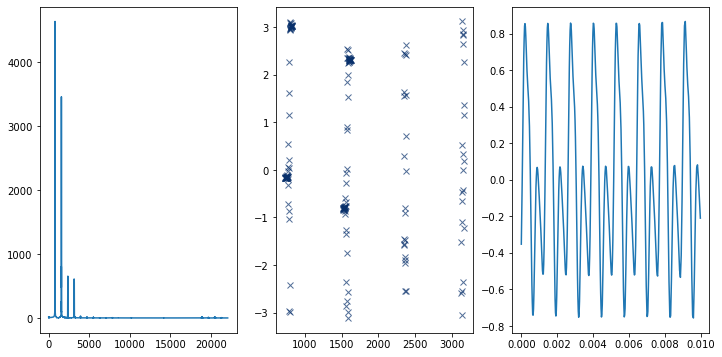

In [29]:
wave = read_wave('6_3.wav')
wave.make_audio()
segment = wave.segment(start=0.3, duration=0.6)

spectrum = segment.make_spectrum()
plot_three(spectrum, thresh=50)

In [30]:
def zero_angle(spectrum):
    res = spectrum.copy()
    res.hs = res.amps
    return res

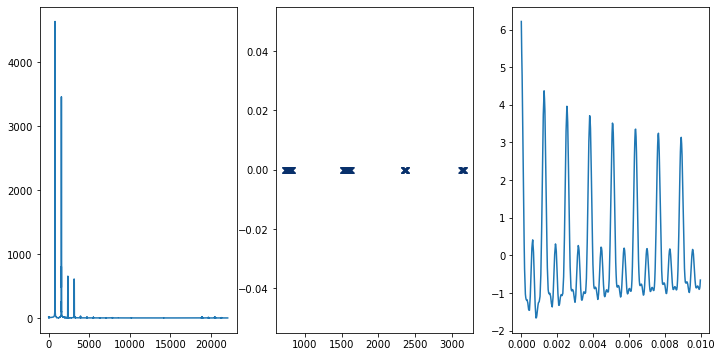

In [31]:
spectrum2 = zero_angle(spectrum)
plot_three(spectrum2, thresh=50)

In [32]:
def rotate_angle(spectrum, offset):
    res = spectrum.copy()
    res.hs *= np.exp(1j * offset)
    return res

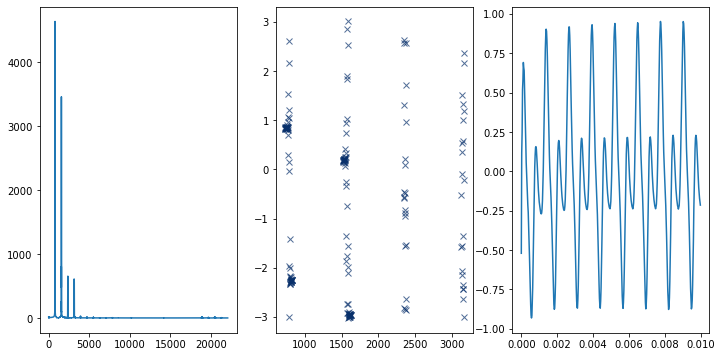

In [33]:
spectrum3 = rotate_angle(spectrum, 1)
plot_three(spectrum3, thresh=50)

In [34]:
def random_angle(spectrum):
    res = spectrum.copy()
    angles = np.random.uniform(0, PI2, len(spectrum))
    res.hs *= np.exp(1j * angles)
    return res

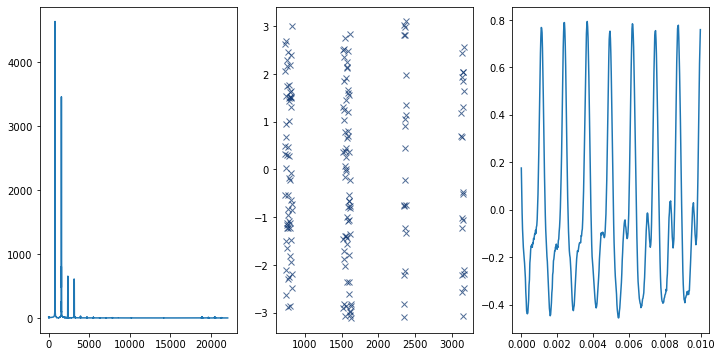

In [35]:
spectrum4 = random_angle(spectrum)
plot_three(spectrum4, thresh=50)